# Image Registration

## Εγκατάσταση Απαραίτητων Βιβλιοθηκών

In [1]:
%pip install --upgrade pip
%pip install numpy
%pip install opencv-python
%pip install scipy
%pip install matplotlib
%pip install scikit-image

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


## Φόρτωση Βιβλιοθηκών

In [1]:
import numpy
import cv2
import matplotlib.pyplot as plt
import scipy
import skimage as io
import skimage as color
import skimage as transform
import skimage as metrics
import os
import random

## Φόρτωση των Απαραίτητων Αρχείων

In [2]:
image_path = '/Users/marina/Python/Registration/FIRE/Images'
image_filenames = [filename for filename in os.listdir(image_path) if filename.endswith(".jpg")]

selected_pairs = random.sample(image_filenames, 10)
for pair in selected_pairs:
    print(pair)

S53_1.jpg
S51_2.jpg
S06_1.jpg
P14_2.jpg
A10_1.jpg
S19_1.jpg
P35_2.jpg
S57_2.jpg
P44_1.jpg
S20_1.jpg


## Read the .jpg files

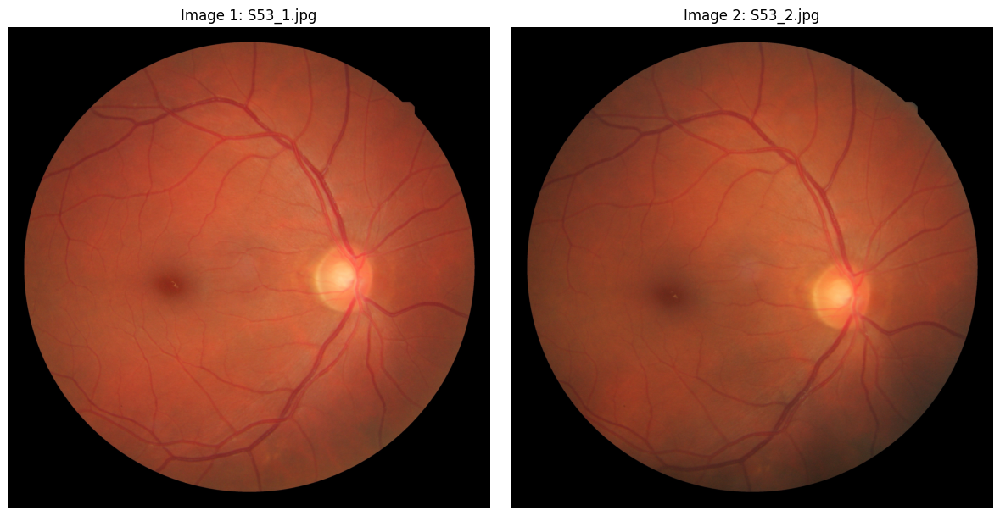

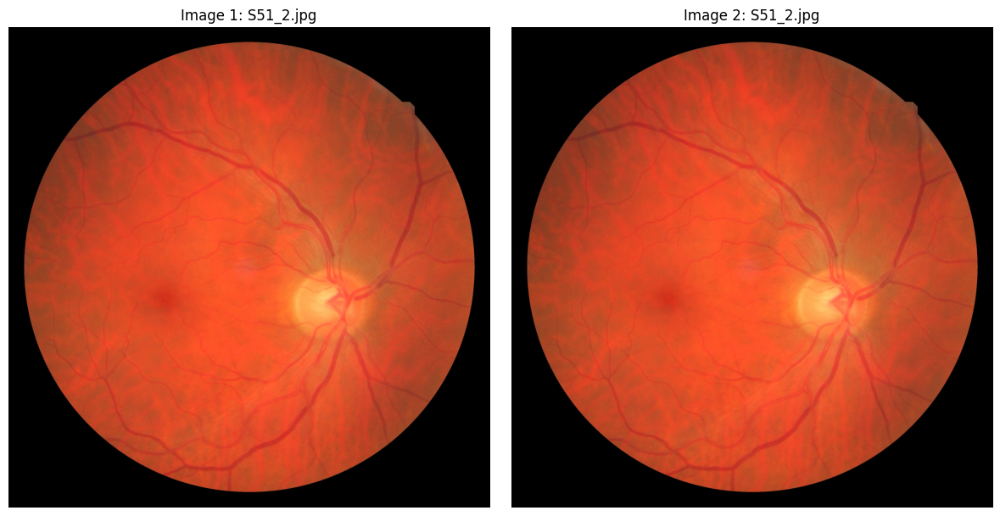

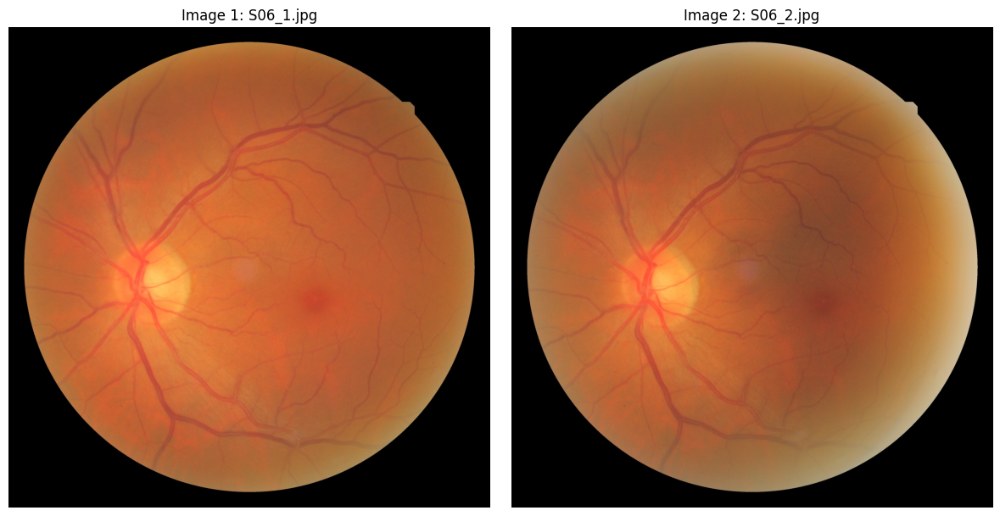

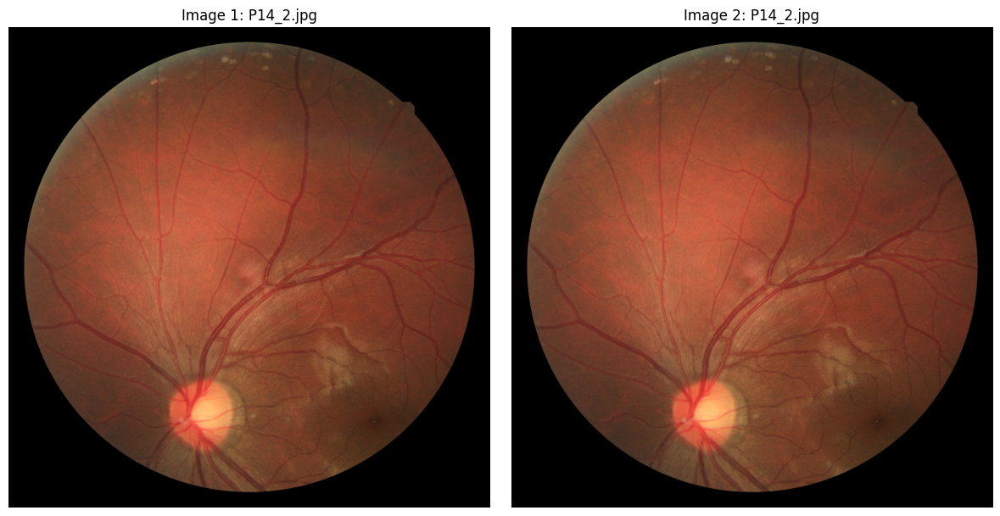

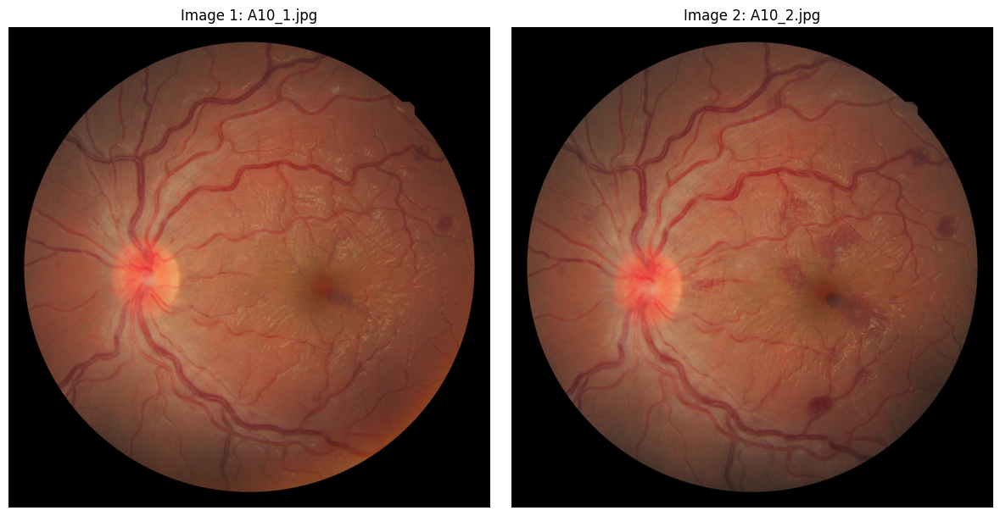

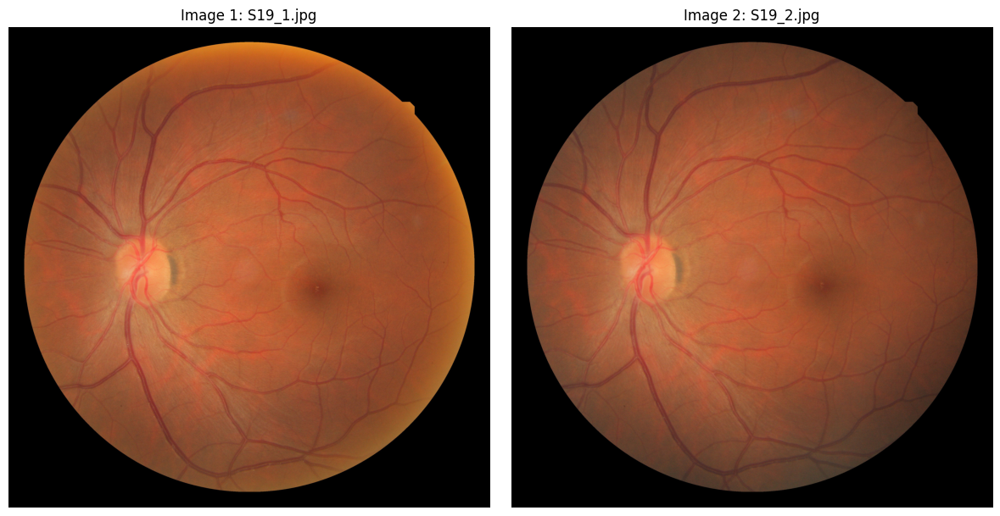

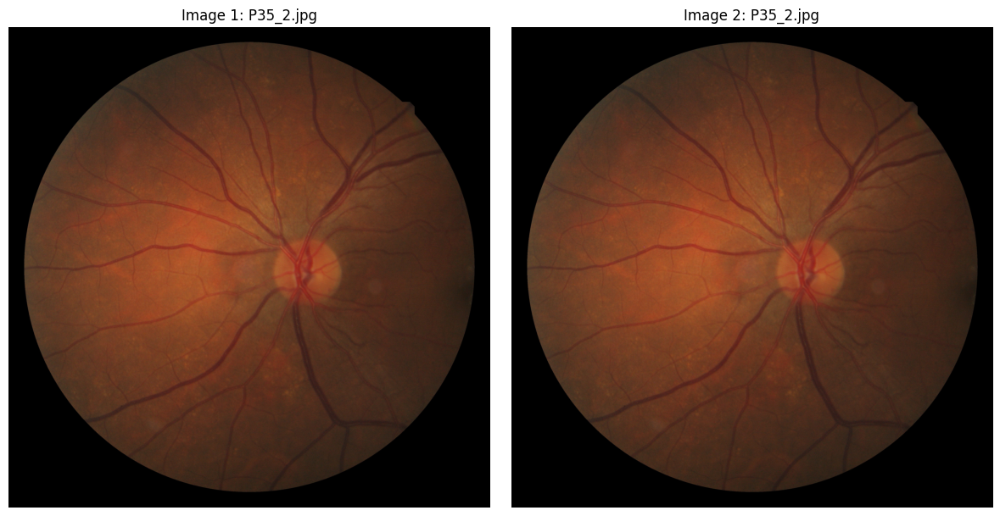

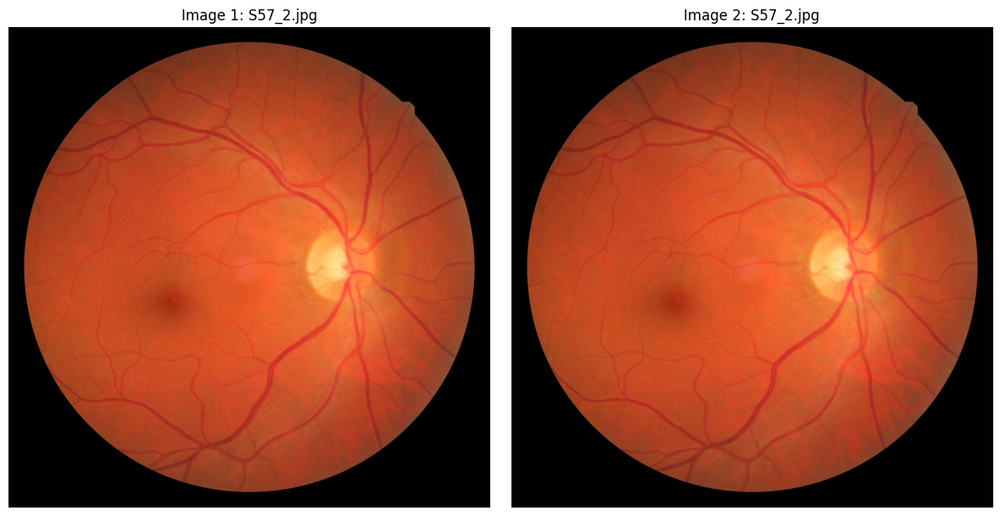

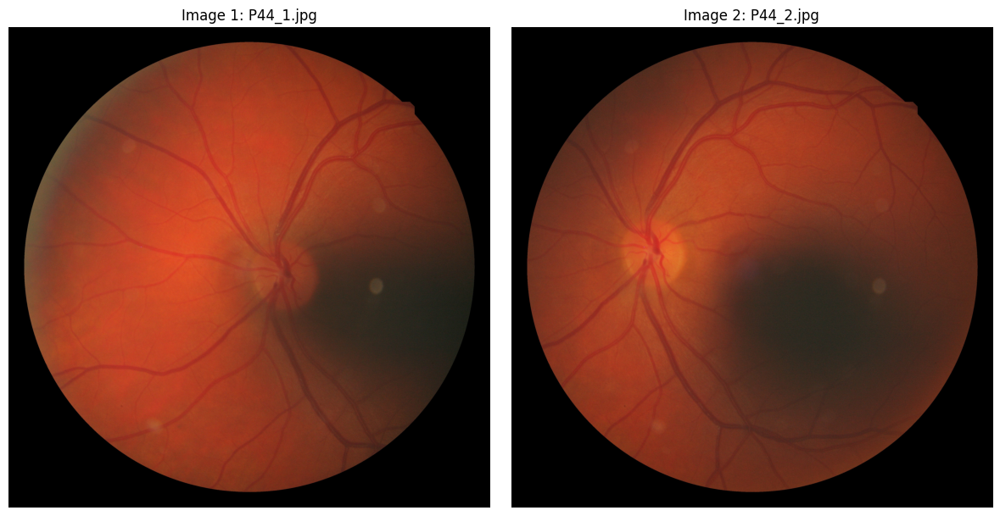

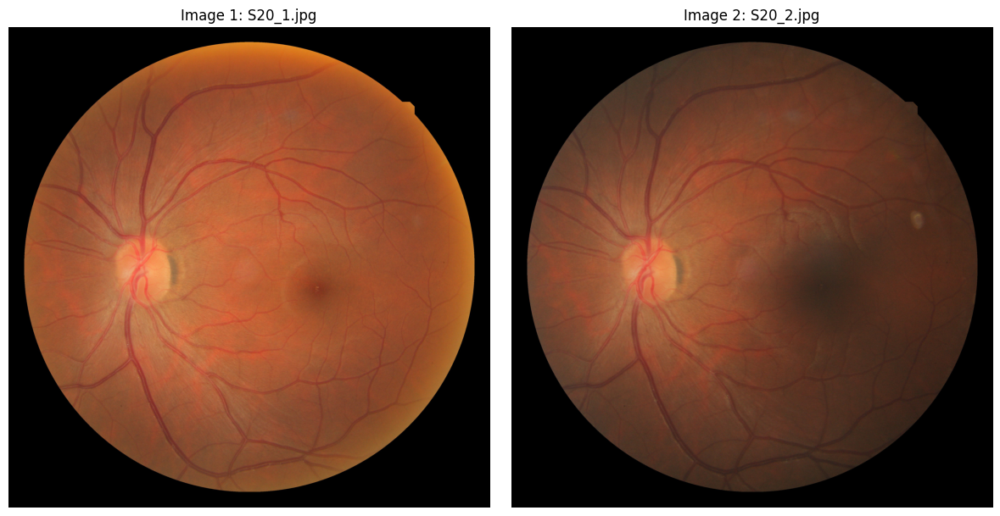

In [5]:
# Display the selected pairs
for filename in selected_pairs:
    # Διαβάστε τις δύο εικόνες του ζεύγους
    image1_path = os.path.join(image_path, filename)
    image2_path = os.path.join(image_path, filename.replace("_1", "_2"))

    img1 = cv2.imread(image1_path)
    img2 = cv2.imread(image2_path)

    # Display both images
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
    plt.title(f"Image 1: {filename}")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
    plt.title(f"Image 2: {filename.replace('_1', '_2')}")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

## Project the edges of the 1st image onto the 2nd

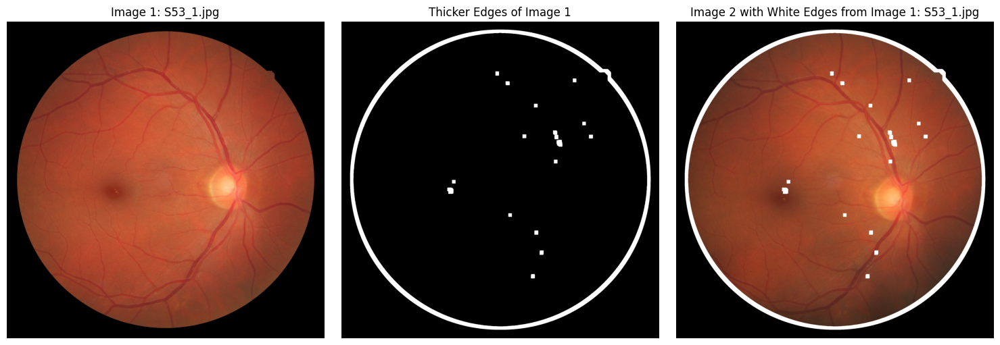

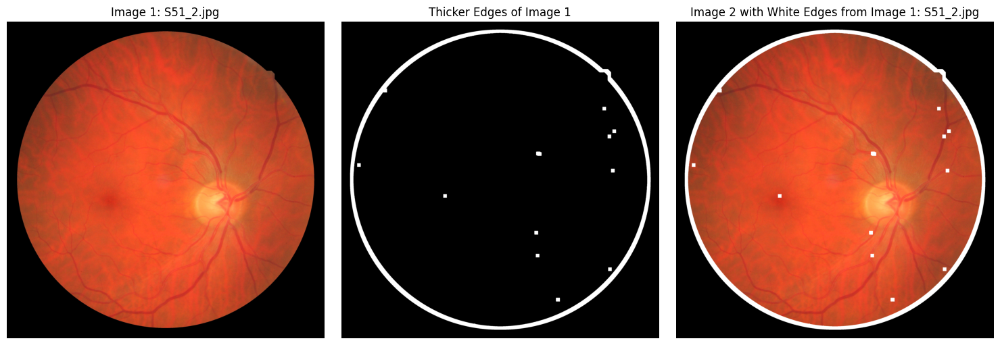

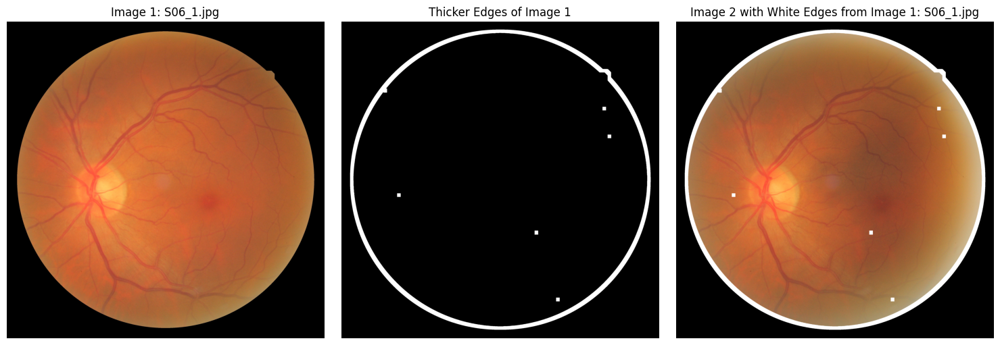

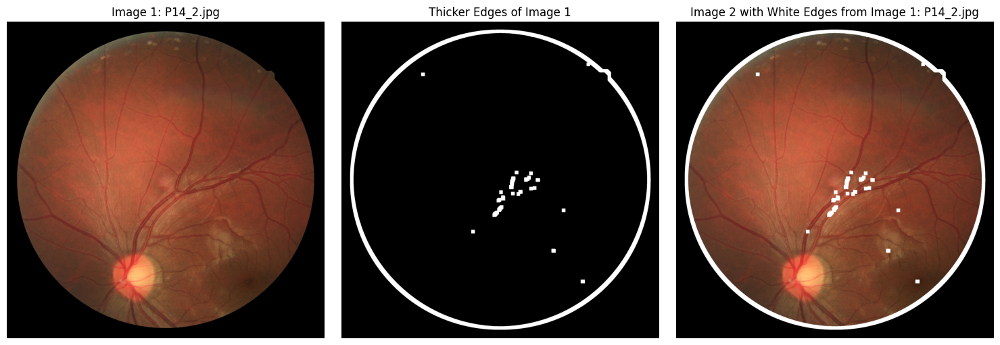

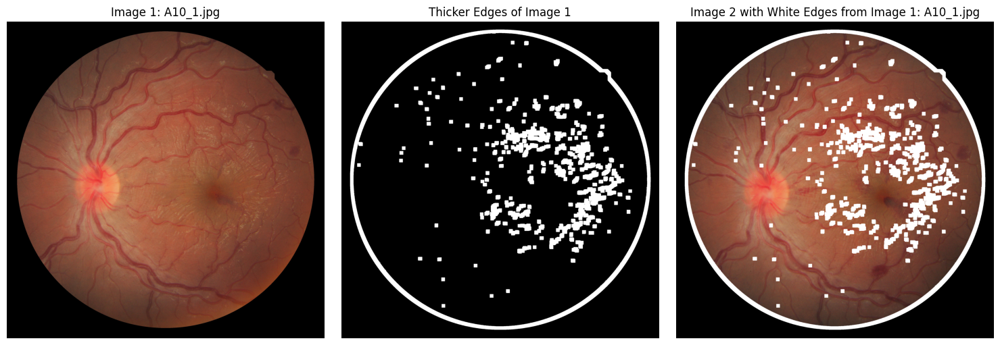

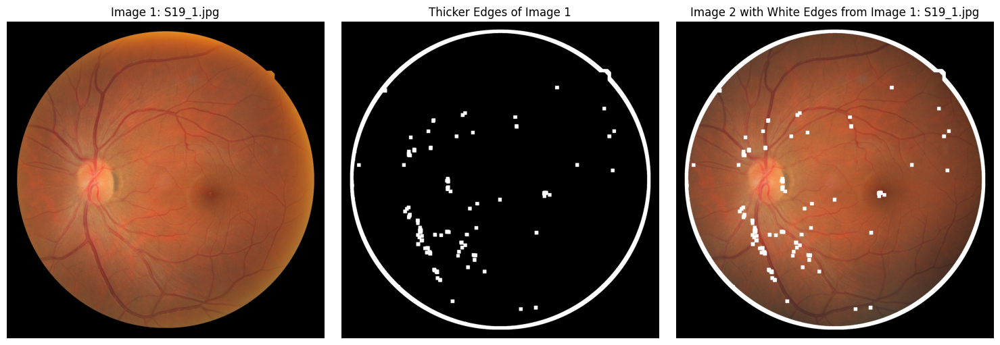

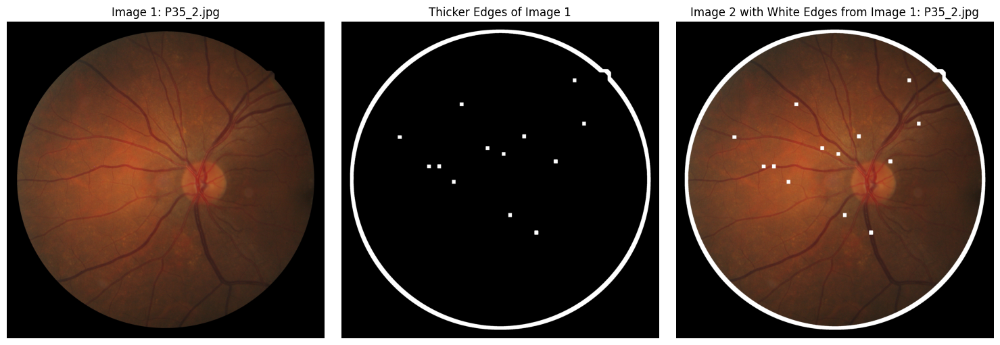

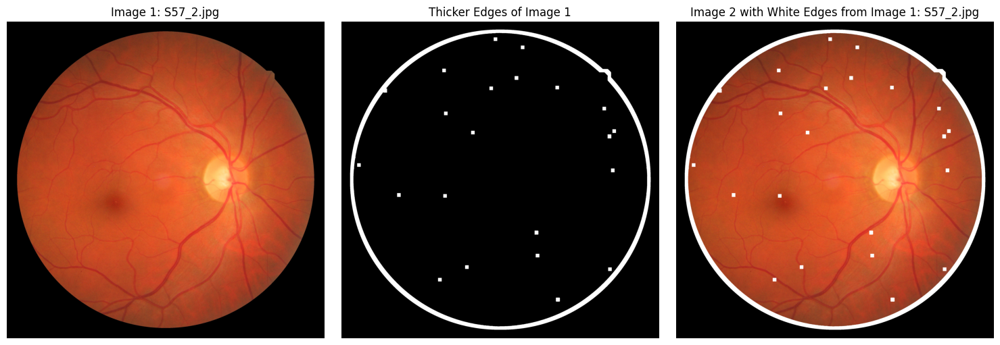

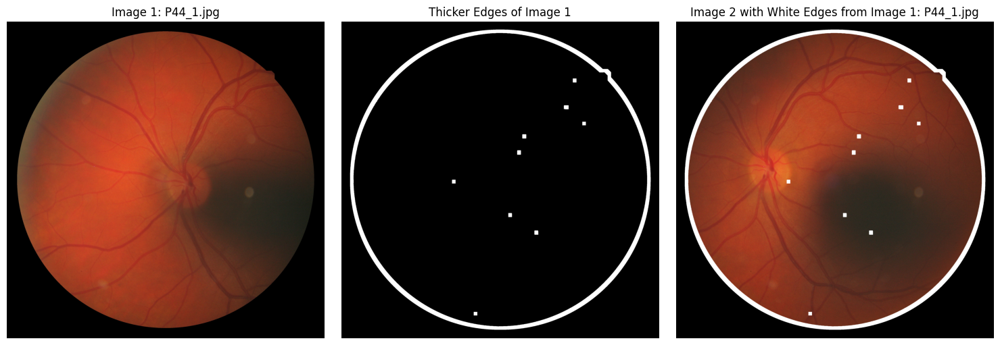

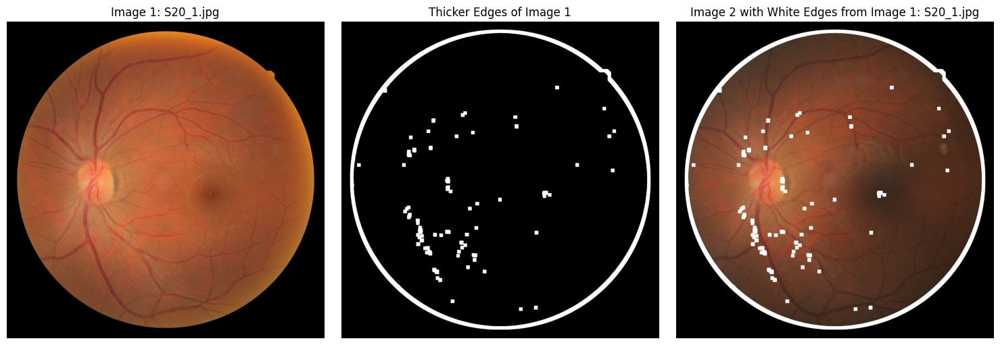

In [6]:
# Display the selected pairs
for filename in selected_pairs:
    image1_path = os.path.join(image_path, filename)
    image2_path = os.path.join(image_path, filename.replace("_1", "_2"))  # Υποθέτοντας σύμβαση ονοματολογίας

    img1 = cv2.imread(image1_path)
    img2 = cv2.imread(image2_path)

    # Convert to GrayScale
    gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

    # Canny Algorithm
    edges1 = cv2.Canny(gray1, 50, 150)
    edges2 = cv2.Canny(gray2, 50, 150)

    edges1_thicker = cv2.dilate(edges1, None, iterations=15)
    edges2_thicker = cv2.dilate(edges2, None, iterations=15)

    # Add the edges of the 1st image to the 2nd with white color
    img2_with_edges = img2.copy()
    img2_with_edges[edges1_thicker > 0] = [255, 255, 255] # λευκό

    # Display Images
    plt.figure(figsize=(15, 5))

    # Image 1
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title(f"Image 1: {filename}")

    # Edges 1
    plt.subplot(1, 3, 2)
    plt.imshow(cv2.cvtColor(edges1_thicker, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Thicker Edges of Image 1")

    # Image 2 with edgse from Image 1
    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(img2_with_edges, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title(f"Image 2 with White Edges from Image 1: {filename}")

    plt.tight_layout()
    plt.show()

## Ground Truth for Homologous Points and Affine Heometric Transformation Matrix

In [9]:
import numpy as np

ground_truth = '/Users/marina/Python/Registration/FIRE/Ground'
ground_truth_filenames = [f"control_points_{filename.replace('_1.jpg', '_1_2.txt').replace('_2.jpg', '_1_2.txt')}" for filename in selected_pairs]

# Save homologous points
output_filename = 'homologous_points.txt'

# Check if the ground truth files exists and display the homologous points
with open(output_filename, 'w') as output_file:
    for image_filename, ground_truth_filename in zip(selected_pairs, ground_truth_filenames):

        image1_path = os.path.join(image_path, image_filename)
        image2_path = os.path.join(image_path, image_filename.replace("_1", "_2"))

        img1 = cv2.imread(image1_path)
        img2 = cv2.imread(image2_path)

        # Read the homologous from the ground truth file
        ground_truth_filepath = os.path.join(ground_truth, ground_truth_filename)
    
        # Homologous points lists
        src_point = []
        dst_point = []

        if os.path.exists(ground_truth_filepath):
            homologous_points = np.loadtxt(ground_truth_filepath)

            # Homologous points for selected pairs
            for i in range(len(homologous_points)):
                src_point.append((homologous_points[i][0], homologous_points[i][1]))
                dst_point.append((homologous_points[i][2], homologous_points[i][3]))


            # Display the pairs
            output_file.write(f"Image: {image_filename}, Ground Truth: {ground_truth_filename}")
            output_file.write(f"Homologous Points:\n{homologous_points}")
            output_file.write("-" * 30)
        else:
            output_file.write(f"Ground Truth file not found: {ground_truth_filename}")

# Print lists
print(f"src_point: {src_point}")
print(f"dst_point: {dst_point}")
print("=" * 30)

# Convert lists itno numpy array
src_point = np.array(src_point, dtype=np.float32)
dst_point = np.array(dst_point, dtype=np.float32)

# Affine Geometric Transformation
affine_transform, _ = cv2.estimateAffine2D(src_point, dst_point)

if affine_transform is not None:
    print("The Affine Transformation:")
    print(affine_transform)
else:
    print("Failed to evaluate the affine transformation.")



src_point: [(637.0, 626.0), (1679.0, 323.0), (2261.0, 1066.0), (728.0, 1553.0), (1262.0, 2726.0), (1401.0, 1800.0), (2342.0, 2287.0), (1546.0, 863.0), (752.0, 2016.0), (845.0, 1166.0)]
dst_point: [(648.0, 637.0), (1675.0, 327.0), (2259.0, 1056.0), (748.0, 1553.0), (1287.0, 2707.0), (1418.0, 1790.0), (2349.0, 2262.0), (1551.0, 862.0), (778.0, 2010.0), (860.0, 1170.0)]
The Affine Transformation:
[[ 9.88019642e-01  1.00169925e-02  1.36666626e+01]
 [-1.02188822e-02  9.88611510e-01  2.49764973e+01]]


## Apply the transformation to one image and one technique visualization to see the accuracy of the transformation.

Affine Transformation:
[[ 9.88671948e-01  1.03543956e-02  1.25748862e+01]
 [-1.03543956e-02  9.88671948e-01  2.50621011e+01]]


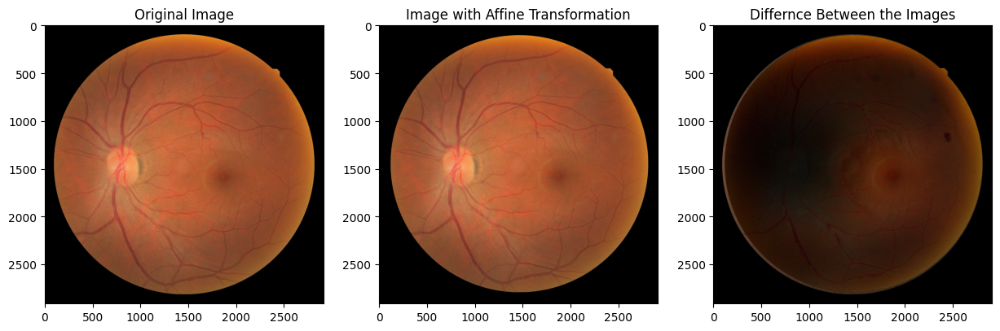

In [10]:
# Converrt point lists to numpy array
src_point = np.array(src_point)
dst_point = np.array(dst_point)

# Calculate Affine geometric transformation
affine_transform = cv2.estimateAffinePartial2D(src_point, dst_point)[0]

if affine_transform is not None and affine_transform.shape == (2, 3):
    print("Affine Transformation:")
    print(affine_transform)
else:
    print("Failed to evaluate the affine transformation.")

# Apply transformation to the first image
transformed_image = cv2.warpAffine(img1, affine_transform, (img2.shape[1], img2.shape[0]))

# Visualize the transformation
difference_image = cv2.absdiff(img2, transformed_image)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(transformed_image, cv2.COLOR_BGR2RGB))
plt.title('Image with Affine Transformation')

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(difference_image, cv2.COLOR_BGR2RGB))
plt.title('Differnce Between Images')

plt.show()

## Correlation Coefficient and Mutual Information

In [12]:
from scipy.stats import pearsonr
from sklearn.metrics import mutual_info_score

# Before Transformation
# Calculate Correlation Coefficient
correlation_coefficient_before, _ = pearsonr(gray1.flatten(), gray2.flatten())

# Calculate Mutual Information
mutual_information_before = mutual_info_score(gray1.flatten(), gray2.flatten())

print("Before Transformation:")
print(f"Correlation Coefficient: {correlation_coefficient_before}")
print(f"Mutual Information: {mutual_information_before}")

# After Transformation
# Calculate correlation Coefficient
correlation_coefficient_after, _ = pearsonr(transformed_image.flatten(), img2.flatten())

# Calculate Mutual Information
mutual_information_after = mutual_info_score(transformed_image.flatten(), img2.flatten())


print("\nAfter Transformation:")
print(f"Correlation Coefficientς: {correlation_coefficient_after}")
print(f"Mutual Information: {mutual_information_after}")

Before Transformation:
Correlation Coefficient: 0.9333838669297037
Mutual Information: 0.9241150088857246

After Transformation:
Correlation Coefficientς: 0.9254634651244935
Mutual Information: 1.2073289548495905
